In [1]:
cd /Users/cl1704/PycharmProjects/clustering_in_rnns

/Users/cl1704/PycharmProjects/clustering_in_rnns


In [2]:
#from Experiment_5.SiegelMillerTask import generate_trials
import networkx as nx
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import gridspec
import seaborn as sns
import numpy as np
import os
import statsmodels.api as sm
import scipy.optimize as opt
import math
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots
#from psychometrics import *
from sklearn.cluster import DBSCAN
from sklearn.decomposition import PCA
import networkx as nx
from sklearn.cluster import KMeans
plt.rcParams["axes.grid"] = False
from sklearn.manifold import TSNE
matplotlib.rcParams['axes.linewidth'] = .5

In [25]:
from sklearn.datasets import make_blobs
import pandas as pd
X, y = make_blobs(n_samples=1000, centers=5,cluster_std=2, n_features=2)



In [26]:
rows = []
for sample in range(1000):
    rows.append({'sample': sample,
                 'cluster':y[sample],
                 'x':X[sample,0],
                 'y':X[sample,1]})
df = pd.DataFrame(rows)

/var/folders/9_/yjc4d8zx4tj6kw6h4xgj4zd80000gn/T/ipykernel_59746/889140399.py:5: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data = df, x = 'x', y = 'y',ax=ax,s=12,alpha = .25,color='gray',palette = sns.husl_palette(3,s=1),legend=False)


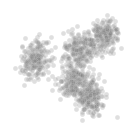

In [27]:
fig = plt.figure(figsize=(1.5,1.5))
gs = gridspec.GridSpec(1,1)
ax=fig.add_subplot(gs[0,0])
palette = sns.husl_palette()
sns.scatterplot(data = df, x = 'x', y = 'y',ax=ax,s=12,alpha = .25,color='gray',palette = sns.husl_palette(3,s=1),legend=False)
ax.axes.get_xaxis().set_visible(False)
ax.axes.get_yaxis().set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
fig.savefig('Figures/Exp_2_Fig_1.jpg',
    format='jpeg',
    dpi=450,
            bbox_inches='tight')

#sns.kdeplot(data = df, x = 'x', y = 'y',ax=ax,s=12,alpha = 1,color='gray',levels=50,linewidths = .5)

In [96]:
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def compose1(f, c):
    # compose a function of two variable with the constant function phi(x)=c:  f(phi(x), y) 
    g = lambda y: f(c, y)
    return g

def compose2 (f, c):
     # compose a function of two variable with the constant function phi(x)=c: f(x, phi(x))
    g = lambda x: f(x, c)
    return g

def composefh(f, h):
    # compose the function f(x,y) with y=h(x):
    g = lambda x: f(x, h(x))
    return g

def get_curve(M, v, f):
    # M a 3-list or array- represents a point in the plane of intersection: M=[x0, y0, 0]
    # v= [a, b, 0] direction contained in the plane along with w=[0,0,1]
    # f function of two variables that define the equation of the surfae z=f(x,y)
    # returns the function g that defines the equation y=g(x) of the curve of intersection
    
    x0, y0, _ =M
    a, b, _ = v 
    if a == 0 and b != 0:
        g = compose1(f, x0)
        id =1
    elif a != 0 and b==0:
        g =compose2(f, y0)
        id=2
    else:
        h = lambda x: y0+b*(x-x0)/a
        g = composefh(f, h)
        id=3
    return g, id    

# Function that returns the X, Y, Z-array defining the section plane as a Plotly surface
def get_plane(M, v,   id, xx, yy, zz):
    
    # M point contained by the plane
    # v direction included in plane (orthogonal to w=[0, 0, 1])
    # id - is the id returned by the function get_curve; the plane arrays, X, Y, Z,  are defined according to id value
    x0, y0, _= M
    a, b, _= v
  
    if id == 1:
        Y, Z = np.meshgrid(yy, zz)
        X = x0*np.ones(Y.shape)
    elif id == 2 :
        X, Z = np.meshgrid(xx, zz)
        Y = y0*np.ones(X.shape)
    elif id == 3 :
        X, Z = np.meshgrid(xx, zz)
        Y = y0+b*(X-x0)/a   
    else:
        pass
    return X, Y, Z
        

# Define the surface to be cut by a plane:
f_surf = lambda x, y:  (x+y)/(2+np.cos(x)*np.sin(y))

# and data to instantiate the Plotly Surface:
xx = np.linspace(-2, 5, 200)
yy = np.linspace(0, 10, 300)
x,y = np.meshgrid(xx, yy)
z = f_surf(x, y)
zz = np.linspace(z.min(), z.max(), 100)

# define the elements to get the section plane equation
M = [1, 2, 0]  # a point in the plane
v = [1, 2, 0] # a direction contained in the plane
g, id = get_curve(M, v, f_surf)
X, Y, Z =  get_plane(M, v,   id, xx, yy, zz)

#Define subplots of 1 row and two columns. In the subplot (1,1) draw the surface of equation z=f(x,y) and the cutting plane
#perpendicular on the plane z=0, while in (1,2) the resulted curve.

fig = make_subplots(
     rows=1, cols=1,
     specs=[[{"type": "scene"}]])
fig.add_trace(go.Surface(x=x,
                          y=y, 
                          z=z,
                          colorscale="Viridis",
                          showscale=False), row=1, col=1)
fig.add_trace(go.Surface(x=X, y=Y, z=Z, 
                         colorscale= [[0, "rgb(254, 254, 254)"],
                                      [1, "rgb(254, 254, 254)"]],
                         showscale=False,
                         opacity =0.65), row=1, col=1)
#fig.add_trace(go.Scatter(x= xx, y = g(xx), mode="lines"), row=1, col=2)    
fig.update_layout(title_text="Slicing a surface by a plane",
                  title_x=0.5,
                  scene= {"camera": {"eye": {"x": 1.65, "z":0.75}}},
                  width=900, height=500, yaxis = {"domain":  [0, 0.85]}
              )
fig.update_layout(scene = dict(xaxis = dict(showgrid = False,showticklabels = False),
                                   yaxis = dict(showgrid = False,showticklabels = False),
                                   zaxis = dict(showgrid = False,showticklabels = False)
             ))
fig.update_scenes(xaxis_visible=False, yaxis_visible=False,zaxis_visible=False )

In [98]:
def compute_var(variance,n):
    return np.sum(variance[n:])

def compute_p(k, null_k):
    return np.sum(null_k<k)/len(null_k)

In [103]:
from Experiment_4.net import *
from Experiment_4.ParametricWMTask import generate_trials


In [99]:
df_list = []
for filename in os.listdir('Experiment_4/Results_4'):
    f = os.path.join('Experiment_4/Results_4', filename)
    if os.path.isfile(f):
        df_list.append(pd.read_pickle(f))
original_df = pd.concat(df_list,ignore_index=True) 
original_df = original_df[original_df.mse_z<.0025]
original_df.threshold = original_df.threshold.astype(float)
original_df.weight_decay = original_df.weight_decay.astype(float)
#original_df = original_df[original_df.threshold==.05]
#original_df = original_df[original_df.weight_decay==0]
#original_df = original_df[original_df.n_neurons==50]
#original_df = original_df[original_df.lvar==0]
k=5
original_df['var'] = original_df.variance.apply(lambda x: compute_var(x,k))
#original_df = original_df[original_df.k==k]
original_df.sort_values('mse_z',ascending=True)#

,model_id,w_rec,w_in,w_out,bias,mse_z,weight_decay,threshold,inertia,lvar,dim,n_neurons,k,variance,null_k,var
517,2G4h6yE9,"[[0.0, -0.0011785697, 0.0034114264, -0.0169632...","[[0.03446286, 0.0689225], [-0.0066143116, -0.0...","[[0.013635909, -0.043179315, 0.009185932, 0.00...","[0.2, 0.2, 0.2, 0.2, 0.2, 0.2, 0.2, 0.2, 0.2, ...",0.000266,0.001,0.01,"[nan, 1.0270810901415817, 0.5755361885703477, ...",0.005623,7,100,50,"[0.51042336, 0.1701494, 0.16442621, 0.04745438...","[93, 93, 94, 93, 94]",0.072288
1794,trgaf3g6,"[[0.0, -0.050116226, -0.026885197, -0.06681556...","[[-0.0012038475, 0.0028604823], [-0.0003976776...","[[-0.010513538, -0.004595269, -0.06315857, -0....","[0.2, 0.2, 0.2, 0.2, 0.2, 0.2, 0.2, 0.2, 0.2, ...",0.000268,0.001,0.01,"[nan, 0.7726113753725637, 0.2573903513884695, ...",0.001000,5,100,24,"[0.67909557, 0.1588728, 0.108540826, 0.0249441...","[87, 90, 87, 87, 88]",0.018295
132,QPb17lgg,"[[0.0, -0.020385146, -0.0024050488, -0.0008572...","[[0.0067306864, 0.015182154], [0.15488207, -0....","[[-0.009103762, 0.16867292, 0.0049873474, -0.0...","[0.2, 0.2, 0.2, 0.2, 0.2, 0.2, 0.2, 0.2, 0.2, ...",0.000282,0.001,0.01,"[nan, 0.4203688646135618, 0.256687301274491, 0...",0.001778,6,100,38,"[0.71969175, 0.1203595, 0.086996116, 0.0431961...","[89, 87, 89, 86, 88]",0.021620
106,AhAzV910,"[[0.0, 0.011203032, -0.022409176, 0.0065922556...","[[-0.013945774, 0.29682514], [0.005768513, 0.0...","[[0.05310126, 0.0011979965, 0.18085545, -0.010...","[0.2, 0.2, 0.2, 0.2, 0.2, 0.2, 0.2, 0.2, 0.2, ...",0.000292,0.001,0.01,"[nan, 0.31733119703956036, 0.18002238260688863...",0.001778,5,100,28,"[0.76593554, 0.095961675, 0.079405256, 0.04029...","[85, 86, 83, 84, 86]",0.013342
4365,Ar1gZ8YL,"[[0.0, -0.0028934258, -0.00068143033, -0.00147...","[[0.00083328784, 0.0024329994], [-0.025711995,...","[[-0.006612372, 0.02471484, 0.028028645, -0.00...","[0.2, 0.2, 0.2, 0.2, 0.2, 0.2, 0.2, 0.2, 0.2, ...",0.000329,0.001,0.01,"[nan, 0.4249998099651212, 0.22102277742737864,...",-0.014678,6,100,26,"[0.74579906, 0.10576916, 0.07321538, 0.0472201...","[88, 87, 88, 86, 86]",0.012866
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24,Gy1FfwI6,"[[0.0, -0.067937404, -0.0012317896, -0.0009523...","[[-0.002012737, 0.0030752567], [-0.0030252205,...","[[-0.111762494, -0.078469194, -0.003844968, -0...","[0.2, 0.2, 0.2, 0.2, 0.2, 0.2, 0.2, 0.2, 0.2, ...",0.002495,0.001,0.01,"[nan, 0.34207014887787235, 0.18632460707740314...",0.001000,7,100,22,"[0.7656354, 0.09221939, 0.079468496, 0.0469562...","[85, 88, 84, 86, 85]",0.011218
2875,p5mSKQnC,"[[0.0, 0.0031505856, -0.006063733, -0.01729865...","[[-0.0037299872, -0.0015287073], [0.0026192414...","[[-0.0034143077, 0.014721157, -0.52801603, 0.2...","[0.2, 0.2, 0.2, 0.2, 0.2, 0.2, 0.2, 0.2, 0.2, ...",0.002496,0.001,0.01,"[nan, 1.9432970241249343, 1.9440341126574845, ...",-0.121153,5,100,72,"[0.3055637, 0.0707321, 0.064315096, 0.06069228...","[97, 97, 97, 97, 97]",0.443383
2703,OAQ4M2WG,"[[0.0, 0.10676242, 0.05603049, -0.015627889, 0...","[[-0.024085386, -0.017111123], [-0.0016865811,...","[[0.022434426, -0.004499642, -0.04216237, -0.1...","[0.2, 0.2, 0.2, 0.2, 0.2, 0.2, 0.2, 0.2, 0.2, ...",0.002497,0.001,0.01,"[nan, 1.359672433090862, 1.442807457818467, 1....",-0.082540,7,100,66,"[0.4283733, 0.06478528, 0.055069994, 0.0535503...","[96, 97, 96, 97, 97]",0.350075
4220,hAS3jHdZ,"[[0.0, 0.00018943561, 0.00029409013, -0.060345...","[[-0.07279637, 0.016820475], [0.00504497, -0.0...","[[0.004936437, -0.0009047537, -0.009626688, -0...","[0.2, 0.2, 0.2, 0.2, 0.2, 0.2, 0.2, 0.2, 0.2, ...",0.002499,0.001,0.01,"[nan, 0.337949696640591, 0.19183261536983137, ...",-0.026102,7,100,27,"[0.7570548, 0.09953679, 0.07892912, 0.04063346...","[87, 88, 87, 88, 87]",0.017177


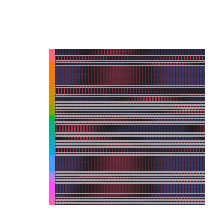

In [104]:
model_data = original_df[original_df.model_id=='2G4h6yE9']
net = Net(n=100,input_size = 2,dale=False)
net.recurrent_layer.weight.data = torch.tensor(model_data['w_rec'].item())
net.recurrent_layer.bias.data = torch.tensor(model_data['bias'].item())
net.input_layer.weight.data = torch.tensor(model_data['w_in'].item())
net.input_layer.bias.data = torch.tensor(0.2)
net.output_layer.weight.data = torch.tensor(model_data['w_out'].item())
net.output_layer.bias.data = torch.tensor(-0.2)
net.sigma_in = 0.0
#variance = model_data['var'].item()
u, z, mask, conditions  = generate_trials(
                            n_trials=25)
x = net(u).detach().cpu().numpy()
rows = []
for k in range(u.shape[0]):
    rows.append({'trial': k,
                 'theta': conditions[k]['theta'],
                 'response': x[k, :, :]})
df = pd.DataFrame(rows)
df = df.groupby('theta').response.apply(lambda r: np.mean(np.stack(r), axis=0)).reset_index()
responses = np.stack(df.response.values)
responses = responses.reshape(-1, responses.shape[2]).T
#responses = responses + .05*(2*np.random.rand(responses.shape[0],responses.shape[1])-1)
#start = int(round(75 * .2))
#responses = responses[:,start::10]


# Remove inactive neurons (before z-scoring)

#responses = responses[np.mean(responses, axis=1) > .01, :]
        
# Z-scoring
responses = (responses - np.mean(responses, axis=1, keepdims=True)) / np.std(responses, axis=1, keepdims=True)
responses = responses[~np.isnan(responses).any(axis=1)]

# cov = np.cov(responses)
# mean = np.mean(responses.T,axis=0)
# responses = np.random.multivariate_normal(mean, cov, responses.shape[1]).T
# 
# rot = special_ortho_group.rvs(responses.shape[0])
# responses = rot @ responses

# pca = PCA(n_components = 5).fit(responses)
# responses= pca.inverse_transform(pca.transform(responses))


# pca = PCA(n_components  = 2)
# responses = pca.inverse_transform(pca.fit_transform(responses.T)).T
k = model_data.k.values[0]

clustering = KMeans(n_clusters=k+1,n_init=20).fit(responses)
labels  = clustering.labels_
sort = np.argsort(labels)
sorted_responses = responses[sort,:]
sns.husl_palette(s=.4)
network_pal = sns.husl_palette(pd.Series(np.sort(labels)).unique().size,s=1)
lut = dict(zip(pd.Series(np.sort(labels)).unique(),network_pal))
row_colors = pd.Series(np.sort(labels)).map(lut)
g = sns.clustermap(pd.DataFrame((sorted_responses)),row_cluster=False, col_cluster=False, row_colors=row_colors,figsize=(2.25,2.25),cbar_pos=None, xticklabels=False, yticklabels=False,center=0)
ax = g.ax_heatmap

shift = 0
for label in np.sort(np.unique(labels)):
    ax.axhline(shift+np.sum(labels==label),color='lightgray',lw=.5)
    shift += np.sum(labels==label)
g.savefig('Figures/Fig_2afc_b.jpg',
    format='jpeg',
    dpi=450,
            bbox_inches='tight'
)

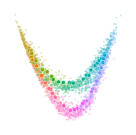

In [127]:

#palette = sns.color_palette("coolwarm", n_colors=50,as_cmap=False)
palette = sns.husl_palette(50,s=1)

u, z, mask, conditions  = generate_trials(
                            n_trials=50)
net.sigma_in =.2
#net.sigma_rec = .25
#x = net.forward(u).detach().numpy()
x = net(u)
z = net.output_layer(x).detach().numpy()
n_components=3
pca = PCA(n_components=n_components)
pca.fit(x[:,::,:].detach().numpy().reshape(-1, x.shape[2]))
x_proj = pca.transform(x.detach().numpy().reshape(-1, x.shape[2])).reshape(x.shape[0],x.shape[1],n_components)
rows = []
for k in range(u.shape[0]):
    for t in range(u.shape[1]):
        rows.append({'trial':k,
                     'theta':conditions[k]['theta'],
                    't':t,
                    'z_1':x_proj[k,t,0],
                    'z_2':x_proj[k,t,1],
                     'z_3':x_proj[k,t,2]})
new_df = pd.DataFrame(rows)
new_df_mean =new_df.groupby(['theta','t']).mean().reset_index()
fig = plt.figure(figsize=(1.5,1.5))
gs = gridspec.GridSpec(1,1)
ax=fig.add_subplot(gs[0,0])
# coherences = np.sort(new_df.motion.unique())
# for i in range(len(coherences)):    
#     motion_df = new_df[new_df.motion == coherences[i]]
#     #ax.plot(motion_df[motion_df.t>=30].z_1.values,motion_df[motion_df.t>=30].z_2.values,color=palette[i],lw=1)
#     ax.plot(motion_df.z_1.values,motion_df.z_2.values,color=palette[i],lw=1)

    # ax.plot(motion_df[motion_df.t<30].z_1.values,motion_df[motion_df.t<30].z_2.values,color='gray',linestyle='--',alpha=.5,lw=1)
#new_df = new_df.groupby(['motion','t']).mean().reset_index()
sns.scatterplot(data=new_df[new_df.t==74],x='z_2',y='z_3',ax=ax,legend=False,s=2,alpha=.25,hue='theta', palette= palette)
sns.scatterplot(data=new_df_mean[new_df_mean.t==74],x='z_2',y='z_3',ax=ax,legend=False,s=8,alpha=1,hue='theta',palette=palette)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.set_xlabel("PC 1",fontsize=7)
ax.set_ylabel("PC 2",fontsize=7)
#ax.set_title(r'$\sum_{i\geq 2}\lambda_i = $'+str(np.round(variance,4)),fontsize=8)
ax.xaxis.set_tick_params(labelsize=7,bottom=True)
ax.yaxis.set_tick_params(labelsize=7,left=True)
ax.spines['left'].set_color('black')
ax.spines['bottom'].set_color('black')
ax.axes.get_xaxis().set_visible(False)
ax.axes.get_yaxis().set_visible(False)
# ax.set_xlim(-1.25,1.25)
# ax.set_ylim(-1.25,1.25)
fig.savefig('Figures/Exp_2_Fig_1.jpg',
    format='jpeg',
    dpi=450,
            bbox_inches='tight')


## Generate 3d manifold data

In [65]:
n_points = 1000
x = []
y = []
z = []


magnitudes= []
theta = []
for i in range(n_points):
    theta_new = np.round(np.random.uniform(low=0, high = 2 * np.pi),3)

    
    x.append(np.sin(theta_new+.5)+.1*(2*np.random.rand() - 1))
    y.append(1*np.cos(1*theta_new+.5)+.1*(2*np.random.rand() - 1))
    z.append(.35*(np.sin(2*theta_new)+np.cos(3*theta_new))+ .1*(2*np.random.rand() - 1))
 
    theta.append(theta_new)
x = np.array(x)
y = np.array(y)
z = np.array(z)



theta = np.array(theta)

palette = sns.husl_palette(50,s=1)
theta_nrml = theta/theta.max()*360

import husl
husl_colors = [husl.husl_to_rgb(h, 90, 65) for h in theta_nrml]
rgb_colors = [f'rgb({int(r*255)}, {int(g*255)}, {int(b*255)})' for r, g, b in husl_colors]
xx = np.linspace(-1.5, 1.5, 400)
yy = np.linspace(-1.5, 1.5, 400)
xx,yy = np.meshgrid(xx, yy)
zz = xx*0


fig = make_subplots(
     rows=1, cols=1,
     specs=[[{"type": "scene"}]])
fig.add_trace(go.Scatter3d(   x=x, y=y, z=z, mode="markers", showlegend=False,
                        marker=dict(color=rgb_colors,opacity=.7, size=4, line=dict(color="white", width=0))))


# 
# 
# fig.add_trace( go.Surface(x=xx, y=yy, z=zz, opacity=.85, showscale=False,
#                       surfacecolor=np.zeros(zz.shape), colorscale=[[0, 'gray']]))

fig.update_scenes(xaxis_visible=False, yaxis_visible=False,zaxis_visible=False )
fig.update_scenes(
    # xaxis=dict(range=[-2,2]),
    # yaxis=dict(range=[-2,2]),
    # zaxis=dict(range=[-1.45,1.45])
)

fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
)
fig.write_image("my_subplots_4.png")


In [59]:
fig.write_image("my_subplots_4.png")

In [217]:
pwd

'/Users/cl1704/PycharmProjects/clustering_in_rnns'

In [216]:
d

NameError: name 'd' is not defined

In [163]:
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def compose1(f, c):
    # compose a function of two variable with the constant function phi(x)=c:  f(phi(x), y) 
    g = lambda y: f(c, y)
    return g

def compose2 (f, c):
     # compose a function of two variable with the constant function phi(x)=c: f(x, phi(x))
    g = lambda x: f(x, c)
    return g

def composefh(f, h):
    # compose the function f(x,y) with y=h(x):
    g = lambda x: f(x, h(x))
    return g

def get_curve(M, v, f):
    # M a 3-list or array- represents a point in the plane of intersection: M=[x0, y0, 0]
    # v= [a, b, 0] direction contained in the plane along with w=[0,0,1]
    # f function of two variables that define the equation of the surfae z=f(x,y)
    # returns the function g that defines the equation y=g(x) of the curve of intersection
    
    x0, y0, _ =M
    a, b, _ = v 
    if a == 0 and b != 0:
        g = compose1(f, x0)
        id =1
    elif a != 0 and b==0:
        g =compose2(f, y0)
        id=2
    else:
        h = lambda x: y0+b*(x-x0)/a
        g = composefh(f, h)
        id=3
    return g, id    

# Function that returns the X, Y, Z-array defining the section plane as a Plotly surface
def get_plane(M, v,   id, xx, yy, zz):
    
    # M point contained by the plane
    # v direction included in plane (orthogonal to w=[0, 0, 1])
    # id - is the id returned by the function get_curve; the plane arrays, X, Y, Z,  are defined according to id value
    x0, y0, _= M
    a, b, _= v
  
    if id == 1:
        Y, Z = np.meshgrid(yy, zz)
        X = x0*np.ones(Y.shape)
    elif id == 2 :
        X, Z = np.meshgrid(xx, zz)
        Y = y0*np.ones(X.shape)
    elif id == 3 :
        X, Z = np.meshgrid(xx, zz)
        Y = y0+b*(X-x0)/a   
    else:
        pass
    return X, Y, Z
        

# Define the surface to be cut by a plane:
f_surf = lambda x, y:  (x+y)/(2+np.cos(x)*np.sin(y))

# and data to instantiate the Plotly Surface:
xx = np.linspace(-2, 5, 200)
yy = np.linspace(0, 10, 300)
# x,y = np.meshgrid(xx, yy)
# z = f_surf(x, y)
zz = np.linspace(z.min(), z.max(), 100)

# define the elements to get the section plane equation
M = [1, 2, 0]  # a point in the plane
v = [1, 2, 0] # a direction contained in the plane
g, id = get_curve(M, v, f_surf)
X, Y, Z =  get_plane(M, v,   id, xx, yy, zz)

#Define subplots of 1 row and two columns. In the subplot (1,1) draw the surface of equation z=f(x,y) and the cutting plane
#perpendicular on the plane z=0, while in (1,2) the resulted curve.

fig = make_subplots(
     rows=1, cols=1,
     specs=[[{"type": "scene"}]])

fig.add_trace(go.Scatter3d(x=x,
                          y=y, 
                          z=z,
                              mode='markers',
                        marker=dict(
                            size=6,
                            color=theta,                # set color to an array/list of desired values
                            colorscale='spectral',   # choose a colorscale
                            opacity=0.8
                        )), row=1, col=1)

# fig.add_trace(go.Surface(x=x,
#                           y=y, 
#                           z=z,
#                           colorscale="Viridis",
#                           showscale=False), row=1, col=1)
fig.add_trace(go.Surface(x=X, y=Y, z=Z, 
                         colorscale= [[0, "rgb(254, 254, 254)"],
                                      [1, "rgb(254, 254, 254)"]],
                         showscale=False,
                         opacity =0.65), row=1, col=1)
#fig.add_trace(go.Scatter(x= xx, y = g(xx), mode="lines"), row=1, col=2)    
fig.update_layout(title_text="Slicing a surface by a plane",
                  title_x=0.5,
                  scene= {"camera": {"eye": {"x": 1.65, "z":0.75}}},
                  width=900, height=500, yaxis = {"domain":  [0, 0.85]}
              )
fig.update_layout(scene = dict(xaxis = dict(showgrid = False,showticklabels = False),
                                   yaxis = dict(showgrid = False,showticklabels = False),
                                   zaxis = dict(showgrid = False,showticklabels = False)
             ))
fig.update_scenes(xaxis_visible=False, yaxis_visible=False,zaxis_visible=False )